<font size=6><center>**cluster and plot v2**</font>

In [80]:
import os,sys,re
import pandas as pd
import numpy as np
from importlib import reload
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.backends.backend_pdf import PdfPages

In [79]:
from src import PATH, utils,my_metrics
from src import leukocyte_cluster as LEUC

In [462]:
reload(LEUC)

<module 'src.leukocyte_cluster' from '/home/wergillius/Project/pan-cancer-leukocyte/leukocyte/src/leukocyte_cluster.py'>

In [34]:
## this is path 2 ..
ALL = utils.read_leukocyte(PATH.leukocyte_path)
print(ALL.shape)
ALL.head(1)

(3149, 23)


,id,B cells naive,B cells memory,Plasma cells,T cells CD8,T cells CD4 naive,T cells CD4 memory resting,T cells CD4 memory activated,T cells follicular helper,T cells regulatory (Tregs),...,Monocytes,Macrophages M0,Macrophages M1,Macrophages M2,Dendritic cells resting,Dendritic cells activated,Mast cells resting,Mast cells activated,Eosinophils,Neutrophils
0,TCGA-05-4249-01A-01R-1107-07,0.002131,0.023685,0.079791,0.030423,0.0,0.097957,0.0,0.034192,0.029121,...,0.010681,0.009018,0.038816,0.116087,0.351658,0.007345,0.139602,0.0,0.0,0.023269


In [35]:
tsne_path="/home/wergillius/Project/pan-cancer-leukocyte/leukocyte/t_sne/ALL_tsne_p30.csv"
tsne_1 = pd.read_csv("/home/wergillius/Project/pan-cancer-leukocyte/leukocyte/t_sne/ALL_tsne_p30.csv")

In [36]:
print(tsne_1.shape)
c.head()

(3136, 6)


,id,axis0,axis1,ac,km,cancer_type
0,TCGA-05-4249-01A-01R-1107-07,-48.048270,20.494755,0,1,NSCLC
1,TCGA-05-4250-01A-01R-1107-07,0.378064,16.299036,2,1,NSCLC
2,TCGA-05-4382-01A-01R-1206-07,-52.349854,-23.976130,1,4,NSCLC
3,TCGA-05-4384-01A-01R-1755-07,-58.403725,-7.113007,0,4,NSCLC
4,TCGA-05-4389-01A-01R-1206-07,59.358723,19.629047,2,2,NSCLC


# LEUC analysis pipline

In [166]:
DF_filtered, statistics=LEUC.statistics_preprocess(ALL,False)

DF_filtered = DF_filtered.merge(tsne_1,left_on=['id'],right_on=['id'])

print(DF_filtered.shape)
DF_filtered.head(3)

(3136, 26)


,id,B cells naive,B cells memory,Plasma cells,T cells CD8,T cells CD4 memory resting,T cells CD4 memory activated,T cells follicular helper,T cells regulatory (Tregs),T cells gamma delta,...,Dendritic cells resting,Dendritic cells activated,Mast cells resting,Mast cells activated,Neutrophils,axis0,axis1,ac,km,cancer_type
0,TCGA-05-4249-01A-01R-1107-07,0.002131,0.023685,0.079791,0.030423,0.097957,0.000000,0.034192,0.029121,0.000000,...,0.351658,0.007345,0.139602,0.0,0.023269,-48.048270,20.494755,0,1,NSCLC
1,TCGA-05-4250-01A-01R-1107-07,0.019897,0.000000,0.028132,0.121202,0.153461,0.060040,0.054603,0.000000,0.001783,...,0.042287,0.000000,0.070442,0.0,0.010245,0.378064,16.299036,2,1,NSCLC
2,TCGA-05-4382-01A-01R-1206-07,0.000000,0.000000,0.144794,0.038011,0.141085,0.015311,0.001384,0.027211,0.000000,...,0.003916,0.000000,0.014265,0.0,0.025810,-52.349854,-23.976130,1,4,NSCLC


In [707]:
print(DF_filtered.iloc[:,1:-5].columns)
data = DF_filtered.iloc[:,1:-5].values
cell_columns=DF_filtered.iloc[:,1:-5].columns
# ALL_tsnes = LEUC.t_sne_tuning(data,'ALL.npy')
data.shape

Index(['B cells naive', 'B cells memory', 'Plasma cells', 'T cells CD8',
       'T cells CD4 memory resting', 'T cells CD4 memory activated',
       'T cells follicular helper', 'T cells regulatory (Tregs)',
       'T cells gamma delta', 'NK cells resting', 'NK cells activated',
       'Monocytes', 'Macrophages M0', 'Macrophages M1', 'Macrophages M2',
       'Dendritic cells resting', 'Dendritic cells activated',
       'Mast cells resting', 'Mast cells activated', 'Neutrophils'],
      dtype='object')


(3136, 20)

## pca

In [443]:
pure_data=DF_filtered.iloc[:,1:-5]
# pure_data=pure_data.drop(labels=['B cells memory','Mast cells activated'],axis=1)
p_data = pure_data.values
print(p_data.shape)

(3136, 20)


In [414]:
from sklearn.decomposition import PCA

In [494]:
# a list of different PCA transformer 
reducer_ls = [PCA(n_components=i,svd_solver='full').fit(p_data) for i in range(2,16)]

# explained percentage list
explained_pctgs = [reducer.explained_variance_ratio_.sum() for reducer in reducer_ls]

Text(0.5, 1.0, 'PCA reduction')

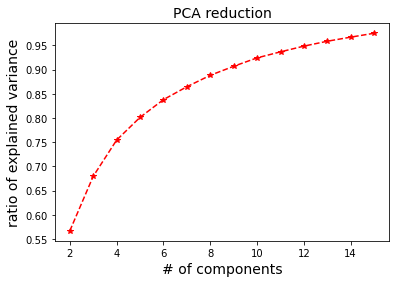

In [669]:
plt.plot(range(2,16),explained_pctgs,'--r*');
plt.xlabel("# of components",fontsize=14)
plt.ylabel("ratio of explained variance",fontsize=14)
plt.title("PCA reduction",fontsize=14)

In [449]:
# we pick n_components = 6
reducer = reducer_ls[4]
pca_data = reducer.transform(p_data)
print(pca_data.shape)

(3136, 6)


### cluster and test

## clustering metrics

In [96]:
from sklearn import metrics

In [74]:
from sklearn.cluster import AffinityPropagation,AgglomerativeClustering,KMeans,MeanShift

<font size=4 color='orange'>**metrics that allow cosine-similarity**
- silhouttee   bigger
- DB ?  bigger
- CH  higher
- gap higher

In [163]:
from sklearn.preprocessing import StandardScaler, Normalizer

In [164]:
sc_data = StandardScaler().fit_transform(data)
norm_data = Normalizer().fit_transform(data)

### simplest elbow method 

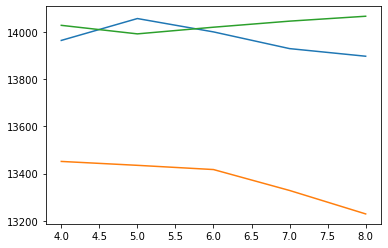

In [157]:
for method in ['ac','km','gmm']:
    wk_ls = [my_metrics.compute_wk(sc_data,labels=label_c,KL=True) for label_c in labels[method]]
    plt.plot(range(4,9),wk_ls);

## jointly consider other index

### pca reduced data

In [ ]:
pca_labels,pca_metrics = LEUC.cluster3(pca_data,n_clusters=range(3, 10))

pctg_exp_vars = [my_metrics.explain_variance(pca_data,label) for label in pca_labels['km']]

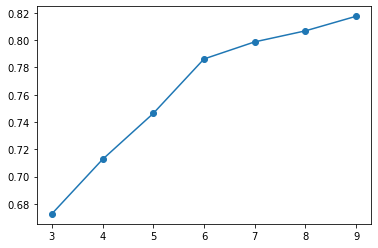

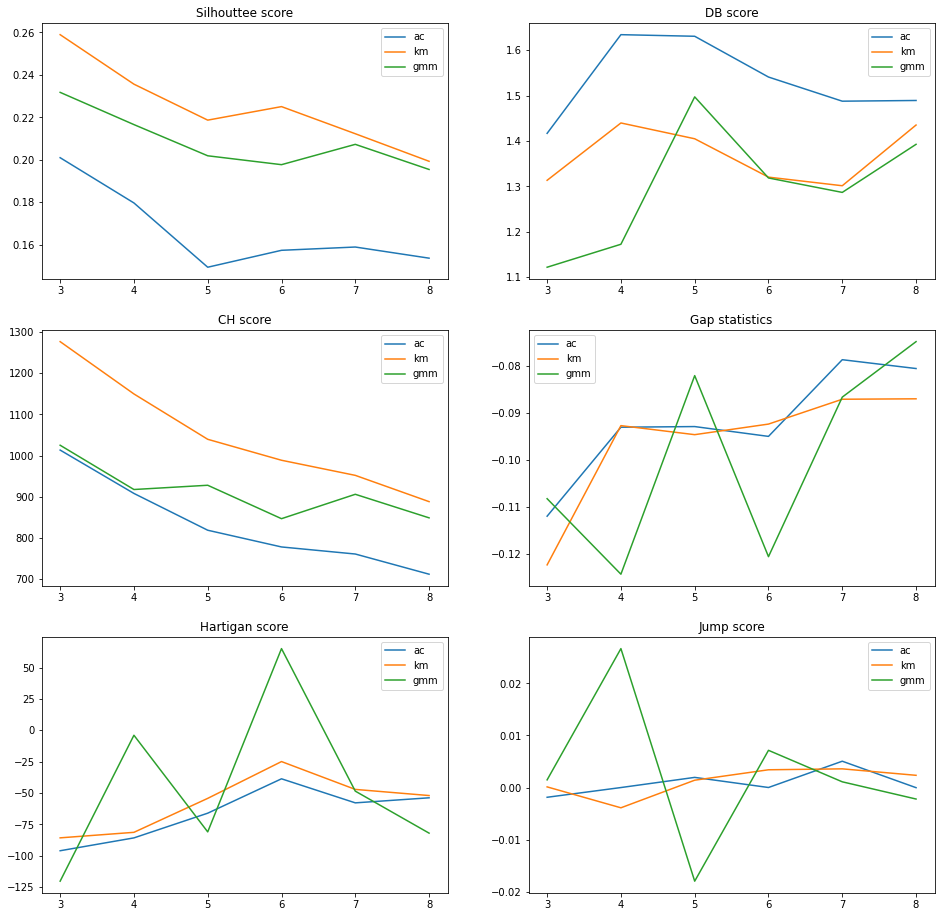

In [487]:
plt.plot(range(3,10),pctg_exp_vars,'-o')

LEUC.metrics_curve(pca_metrics)

### raw data

In [670]:
r_labels,r_metrics_dict = LEUC.cluster3(data,n_clusters=range(3,11))

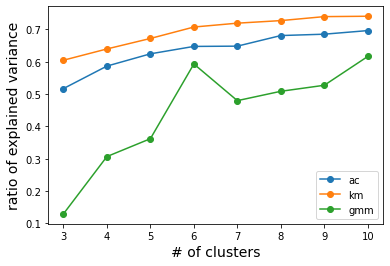

In [531]:
for method in ['ac','km','gmm']:
    r_pctg_exp_vars = [my_metrics.explain_variance(data,label) for label in r_labels[method]]
    plt.plot(range(3,11),r_pctg_exp_vars,'-o',label=method)
plt.xlabel("# of clusters",fontsize=14)
plt.ylabel("ratio of explained variance",fontsize=14)
plt.legend()

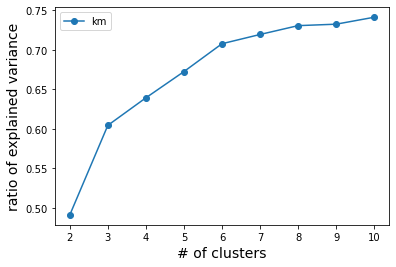

In [581]:
rkm_labels,rkm_metrics=LEUC.cluster3(data,n_clusters=range(2,11),methods=['km'])
r_pctg_exp_vars = [my_metrics.explain_variance(data,label) for label in rkm_labels['km']]
plt.plot(range(2,11),r_pctg_exp_vars,'-o',label='km');
plt.xlabel("# of clusters",fontsize=14)
plt.ylabel("ratio of explained variance",fontsize=14)
plt.legend()

<font size=5 color='navy'> According to elbow method , 3 group and 6 group should be picked

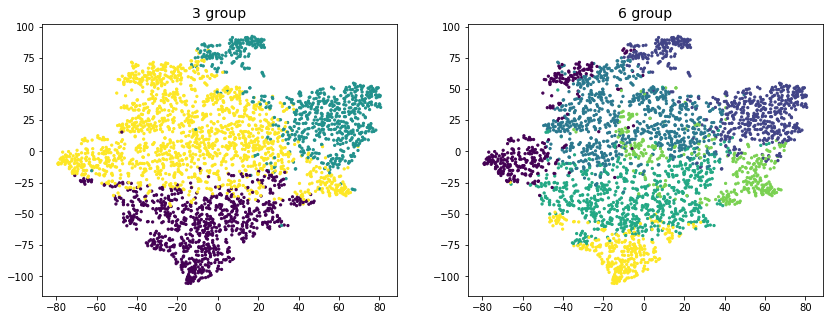

In [696]:
tsne = tsne_1[['axis0',"axis1"]].values
plot_3and6_group(tsne)

In [540]:
DF_reclustering = DF_filtered.iloc[:,:-3]
print(DF_reclustering.columns)

DF_reclustering.loc[:,'km3'] = rkm_labels['km'][1]
DF_reclustering.loc[:,'km6'] = rkm_labels['km'][4]

DF_reclustering.to_csv("cluster_report/20210310_km_label.csv",index=False)

DF_reclustering.head(1)

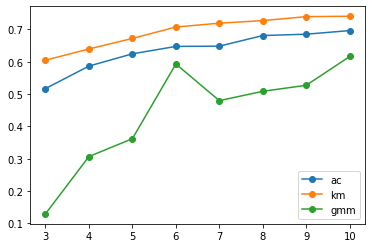

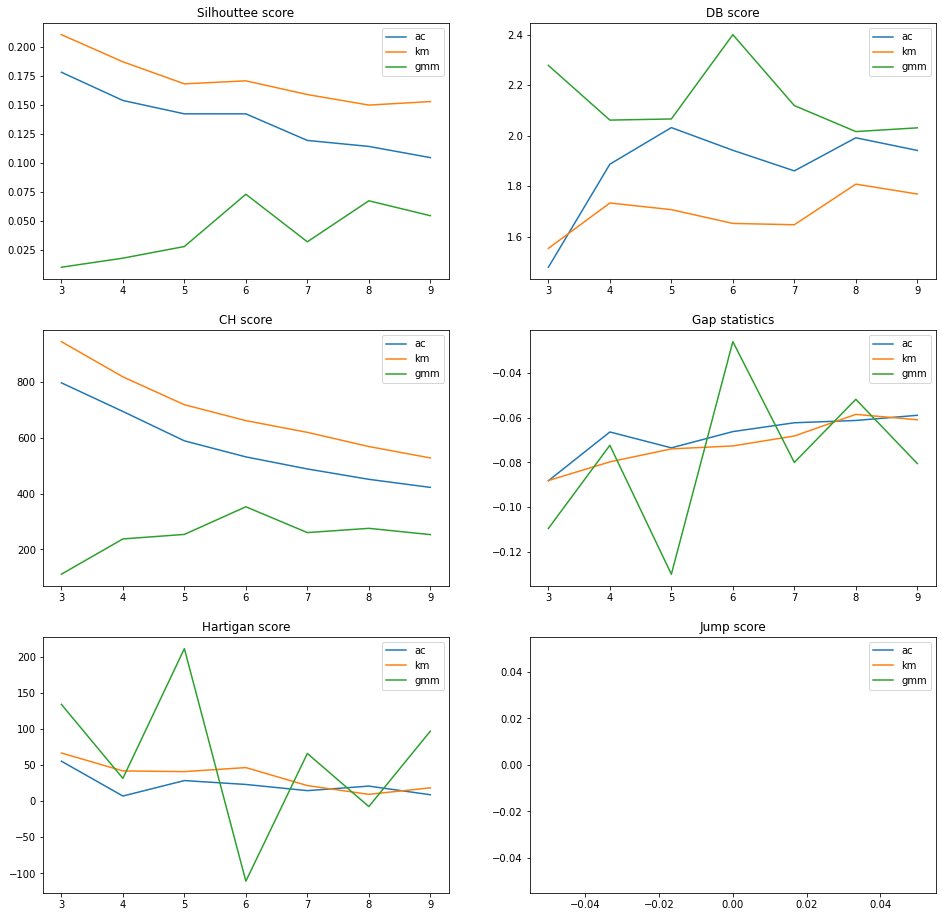

In [505]:

LEUC.metrics_curve(r_metrics_dict)

### normalized data

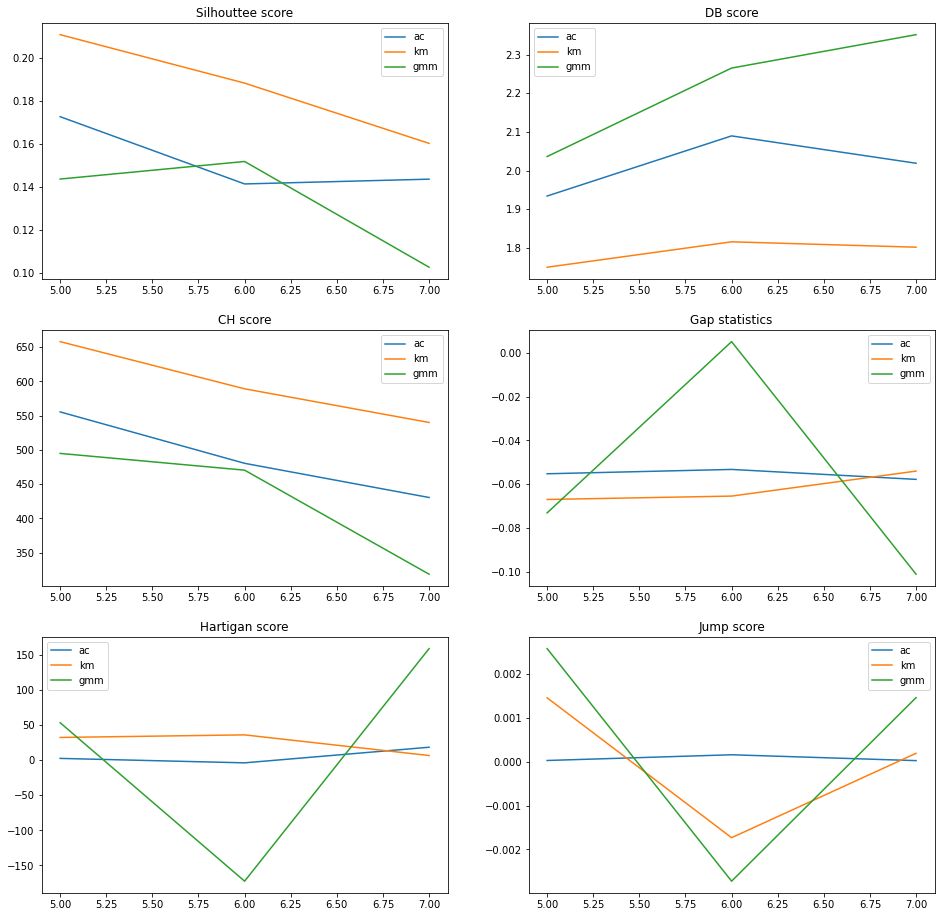

In [451]:
n_labels,n_metrics_dict = LEUC.cluster3(norm_data,n_clusters=range(5,9))
LEUC.metrics_curve(n_metrics_dict)

In [201]:
ALL_tsnes = tsne_1[['axis0','axis1']].values

In [345]:
from sklearn.metrics import pairwise

In [352]:
def compute_wk(X,labels,KL=False,return_Bk=False):
    """
    Wk stands for the sum of euclidean distance of data points to its cooresponding cluster center
    arguments:
    ...X : (n_samples,n_feature)
    ...labels : (n_samples,) dtype = int
    ...KL : recale by k and data dimension p , should set to 'True' when later used to 
       return_Bk : Wk is within group dispersion, Bk is between group dispersion
    """
    p = X.shape[1]
    n_cluster = len(np.unique(labels))
    # get v
    v = np.stack([np.mean(X[labels==c],axis=0) for c in np.unique(labels)])

    # compute si
    wk = np.sum([np.sum(pairwise.pairwise_distances(X[labels ==c],v[c].reshape(1,-1))) for c in np.unique(labels)])
    ## 
    if KL:
        wk = (n_cluster)**(2/p)*wk
        
    if return_Bk:
        x_bar = np.mean(X,axis=0).reshape(1,-1)
        n_k = [np.sum(labels == c) for c in np.unique(labels)]
        Bk = np.dot(pairwise.pairwise_distances(v,x_bar).T,n_k)
        
        return wk,Bk
    else:    
        return wk

<font size=5>
$$Duda = \frac{Je_k}{Je_1} = \frac{\sum_k W_k}{W_m} $$  

$$ criteria = 1- \frac{2}{\pi p} - z \sqrt{\frac{2 (1 - \frac{8}{\pi^2 p})}{n_m p}}  $$


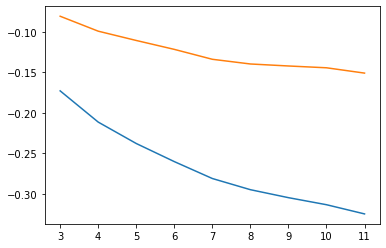

In [406]:
method = 'km'

dh_ls = [LEUC.Duda_Hart_score(data,label,minus_criteria=True,z=0) for label in r_labels[method]]
kl_dh_ls = [LEUC.Duda_Hart_score(data,label,minus_criteria=True,z=0,KL=True) for label in r_labels[method]]

plt.plot(range(3,3+len(r_labels[method])),dh_ls);
plt.plot(range(3,3+len(r_labels[method])),kl_dh_ls);

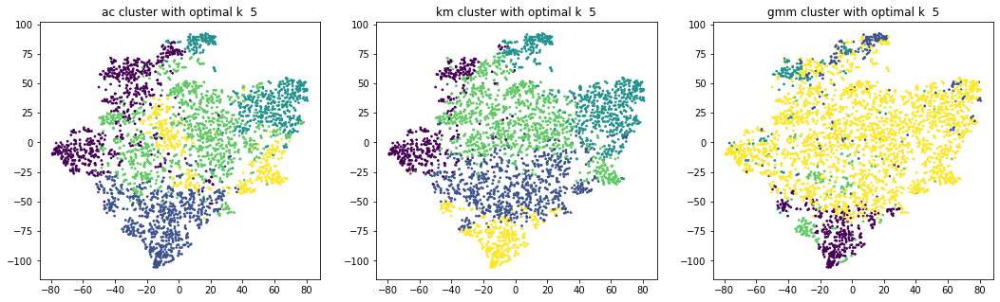

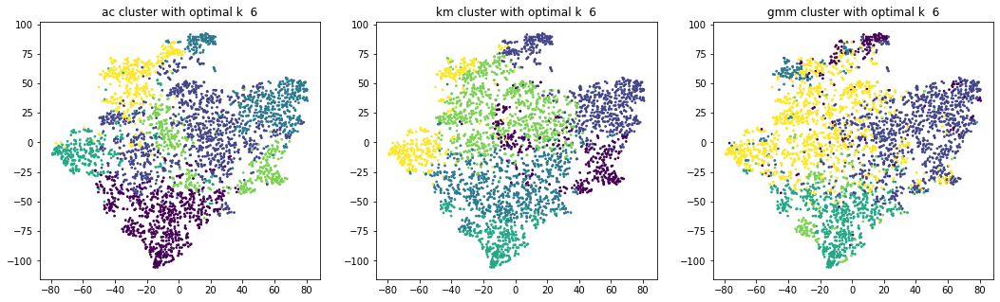

In [574]:
manual_vote = 2
LEUC.t_sne_label(ALL_tsnes,r_labels,r_metrics_dict,manual_vote=manual_vote)
LEUC.t_sne_label(ALL_tsnes,r_labels,r_metrics_dict,manual_vote=manual_vote+1)

In [339]:
tsne_pdf = PdfPages("report/20210309_t-SNE-km5.pdf")
tsne_pdf.savefig(figure=fig)
tsne_pdf.close()

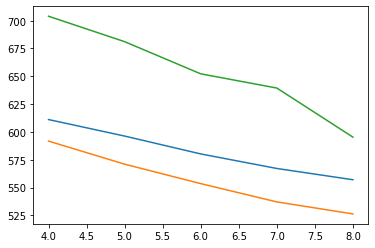

In [176]:
for method in ['ac','km','gmm']:
    wk_ls = [my_metrics.compute_wk(data,labels=label_c,KL=False) for label_c in labels[method]]
    plt.plot(range(4,9),wk_ls);

In [520]:
tsne2DF = pd.read_csv("t_sne/ALL_tsnev2.csv")

In [523]:
tsne2 = tsne2DF[['axis0','axis1']].values

In [ ]:
reducer = 

## recluster in 3 and 6 group

In [704]:
sorted_data,label,_ = LEUC.sort_data_by_label(data,r_labels,r_metrics_dict,method='km',manual_vote=0)
# LEUC.tree_heatmap(sorted_data,None)

In [710]:
colors = utils.read_color()         # read leukocyte color
# cell_label=list(DF_filtered.columns)[1:]                                       # left cell
color_ls=colors.loc[cell_columns].HEX.values   # select from all

## cluster in 5 group

In [390]:
from sklearn.manifold import TSNE

In [392]:
from sklearn.mixture import GaussianMixture as GMM

In [395]:
group5gmm =GMM(n_components=5,covariance_type='tied')

In [397]:
group5gmm.fit_predict(data)

array([2, 2, 2, ..., 2, 2, 2])

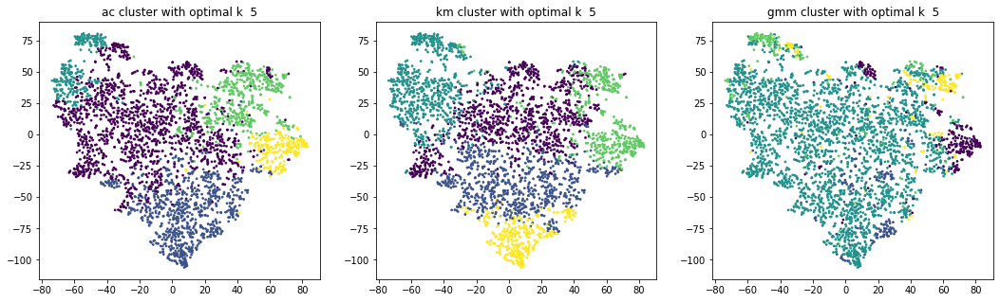

In [684]:
LEUC.t_sne_label(ALL_tsnes,labels,metrics,manual_vote=1)

ValueError: 'c' argument has 1 elements, which is inconsistent with 'x' and 'y' with size 3136.

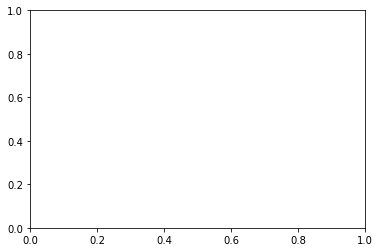

In [206]:
plt.scatter(ALL_tsnes[:,0],ALL_tsnes[:,1],s=4,c=label1)

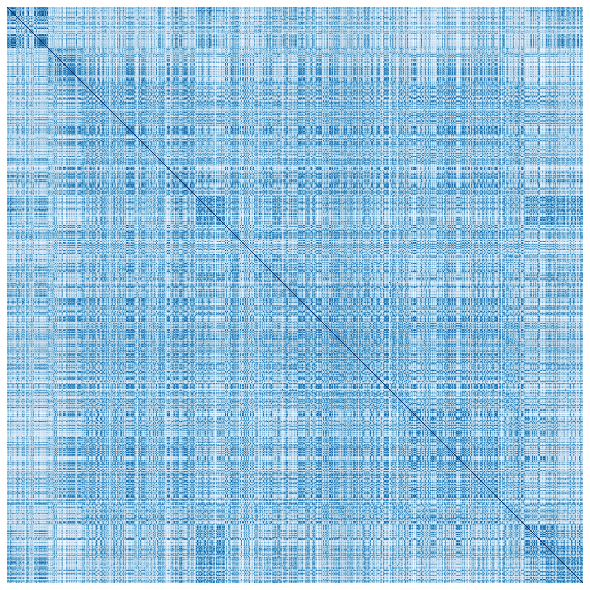

In [682]:
sorted_data,label = LEUC.sort_data_by_label(data,labels,metrics,method='gmm',manual_vote=1)

LEUC.tree_heatmap(sorted_data,None)

this will take several minutes


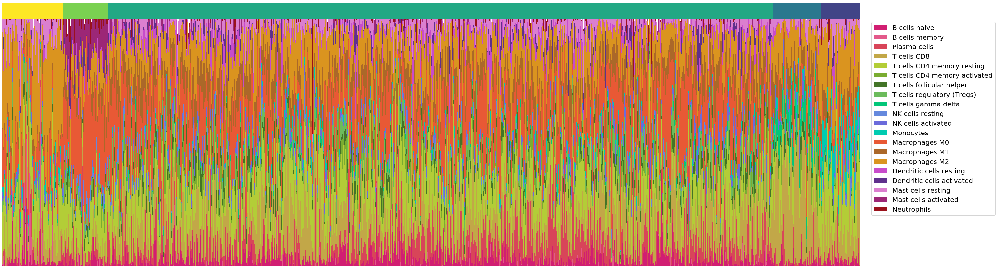

In [683]:
LEUC.stack_barplot(sorted_data,label,cell_label,cmap=color_ls)

#### cancaer type distribution

In [4]:
new_cancer_type = pd.read_csv(os.path.join(PATH.tsne_path,'ALL_tsnev2.csv'),index_col=0)

In [7]:
DF=utils.read_leukocyte(PATH.leukocyte_path,True,None)

In [8]:
DF.keys()

dict_keys(['KIC2', 'LIVER', 'MELANOMA', 'TNBC', 'BLADDER', 'COLON', 'HNSCC', 'NSCLC', 'CERVICAL', 'STOMACH'])

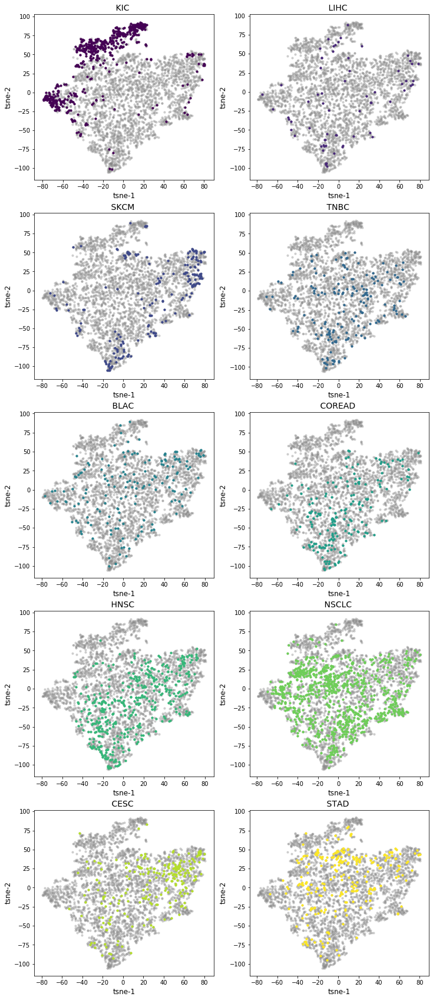

In [10]:
fig = plt.figure(figsize=(12,30))
i = 0
for cancer_type in DF.keys():
    ax = fig.add_subplot(5,2,i+1)
    local_DF,statistics = LEUC.statistics_preprocess(DF[cancer_type],False)
    LEUC.cluter_in_all_no_label(local_DF,cancer_type,ax=ax,**{'color':cm.viridis(i/9)})
    ax.set_title(' {}  '.format(utils.name_dict[cancer_type]),fontsize=14)
    i += 1

In [11]:
pdf = PdfPages('caner_type_distribution_v2.pdf')
pdf.savefig(fig)
pdf.close()

In [ ]:
%debug

# Survival analysis

In [102]:
from lifelines import KaplanMeierFitter

### clinical data

In [93]:
# save the current cluster result

DF_2 = DF_filtered.copy()
DF_2.loc[:,'v2_c6'] = labels['km'][1]
DF_2.loc[:,'v2_c5'] = labels['km'][0]

DF_2.loc[:,['id','v2_c6','v2_c5']].to_csv(os.path.join(PATH.report_path,'cluster_label_v2.csv'),index=False)

In [640]:
# save the current cluster result
DF_3 = DF_filtered.copy()
for method in ['ac','km','gmm']:
    for i,n_cluster in enumerate(range(4,9)):
        DF_3.loc[:,method+str(n_cluster)] = labels[method][i]

# DF_3.loc[:,['id','ac6','ac5']].to_csv(os.path.join(PATH.report_path,'cluster_label_v2.csv'),index=False)

In [637]:
OS_EFS = pd.read_csv(os.path.join(PATH.data_path,'label','survival_time.csv')).drop(['Unnamed: 3'],axis=1)  # read csv data
OS_EFS.head(3)

,A0_Samples,OS/month,A2_Event,EFS/month,A8_New_Event
0,TCGA-KM-8477,51.766667,0.0,51.766667,0
1,TCGA-UW-A7GG,44.233333,0.0,44.233333,0
2,TCGA-KO-8410,104.533333,0.0,104.533333,0


In [629]:
OS_EFS.shape

(3149, 69)

## merging clinical info with k-means clustering result select by elbow method

In [663]:
stage_info = pd.read_csv(os.path.join(PATH.data_path,'label','patient_stage.csv'))
stage_info = stage_info.iloc[:,:25]

stage_info=stage_info.drop([ 'km', 'ac', 'id.1', 'cluster5'],axis=1)
DF_stage = DF_reclustering[['id','km3', 'km6']].merge(stage_info,right_on=['id'],left_on=['id'],how='inner')

print(DF_stage.shape)
print(DF_stage.columns)

DF_stage.to_csv(PATH.data_path+"/label/20210310_recluster_stage_info.csv",index=False)

In [726]:
stage_info.columns 

Index(['id', 'cancer', 'A18_Sex', 'age_at_initial_pathologic_diagnosis',
       'ethnicity', 'race_list.race', 'number_pack_years_smoked',
       'A22_histological_type', 'A6_Stage', 'A3_T', 'A4_N', 'A5_M',
       'anatomic_neoplasm_subdivision', 'menopause_status', 'A8_New_Event',
       'A8_New_Event_Time', 'New_Event_Time_moth', 'A8_New_Event_Type',
       'A2_Event', 'A1_OS', 'OS_month'],
      dtype='object')

In [729]:
survive_col = [col for col in stage_info.columns if ('New_Event' in col)|("OS" in col)]

In [730]:
stage_info[survive_col].head(2)

,A8_New_Event,A8_New_Event_Time,New_Event_Time_moth,A8_New_Event_Type,A1_OS,OS_month
0,0,1523.0,50.766667,NaN,1523.0,50.766667
1,0,121.0,4.033333,NaN,121.0,4.033333


In [731]:
stage_info[survive_col].describe()

,A8_New_Event,A8_New_Event_Time,New_Event_Time_moth,A8_New_Event_Type,A1_OS,OS_month
count,3149.000000,2942.000000,2942.000000,578.000000,3126.000000,3126.000000
mean,0.347094,885.627124,29.520904,2.859862,1039.047025,34.634901
std,0.476122,968.699441,32.289981,1.855083,1077.966591,35.932220
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,0.000000,272.000000,9.066667,1.000000,377.000000,12.566667
50%,0.000000,574.000000,19.133333,3.000000,693.000000,23.100000
75%,1.000000,1140.000000,38.000000,3.000000,1366.750000,45.558333
max,1.000000,10334.000000,344.466667,8.000000,11252.000000,375.066667


## Survival analysis

In [642]:
# seems like the id of OS EFS csv is only the first 12 letters
DF_3.loc[:,'A0_Samples'] = DF_3.id.apply(lambda x: x[:12])
interset_DF=OS_EFS.merge(DF_3.iloc[:,21:],right_on=['A0_Samples'],left_on=['A0_Samples']) 
# merge the DF to have the intersect

interset_DF=interset_DF.dropna()
interset_DF.head(3)

,A0_Samples,OS/month,A2_Event,EFS/month,A8_New_Event,ac4,ac5,ac6,ac7,ac8,km4,km5,km6,km7,km8,gmm4,gmm5,gmm6,gmm7,gmm8
0,TCGA-KO-8414,107.066667,0.0,107.066667,0,0,3,3,1,1,3,0,4,1,4,2,3,3,2,0
1,TCGA-KO-8404,10.833333,1.0,4.933333,1,0,4,4,4,4,2,3,2,2,6,3,0,4,3,3
2,TCGA-KO-8405,101.866667,0.0,101.866667,0,0,4,4,4,4,3,3,2,2,6,3,0,4,3,3


### KM

partition

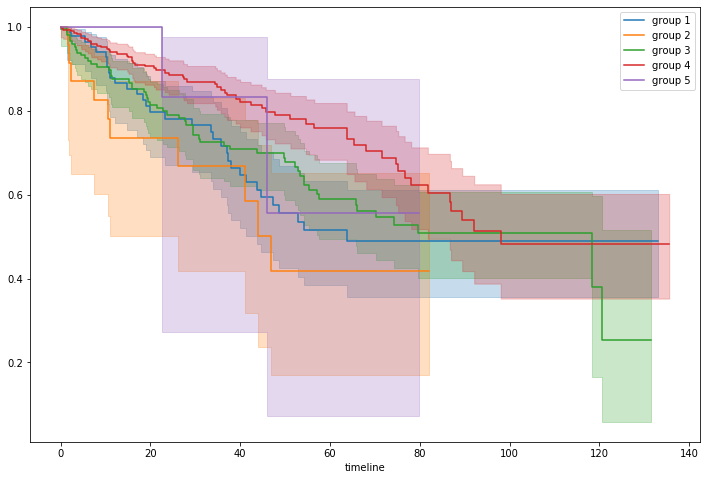

In [647]:
fig = plt.figure(figsize=(12,8))
ax = fig.gca();
kmf_dic = {}
method = 'km'
n_cluster = 5
for i in range(n_cluster):
    kmf_dic[i] = KaplanMeierFitter()
    duration_i = interset_DF.loc[interset_DF[method+str(n_cluster)] == i,'OS/month']
    observe_i = interset_DF.loc[interset_DF[method+str(n_cluster)] == i,'A2_Event']
    kmf_dic[i].fit(duration_i,observe_i,label='group {}'.format(i+1))
#     kmf.survival_function_.plot(ax=ax)
    kmf_dic[i].plot(ax=ax)
    

In [156]:
np.sum(interset_DF.v2_c6 == 0)

225

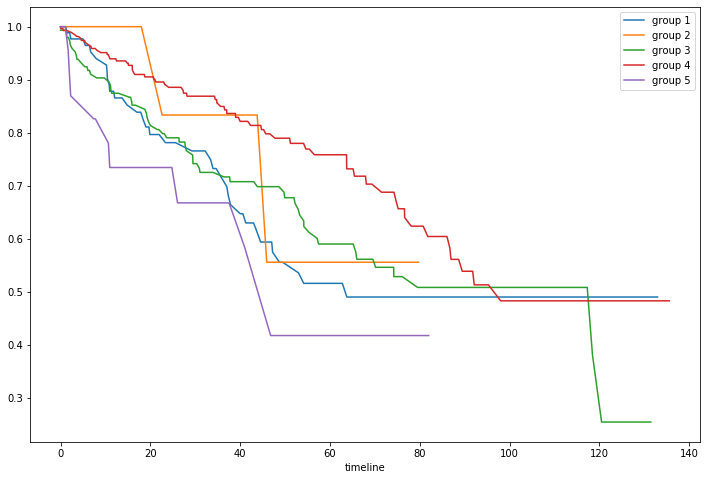

In [172]:
fig = plt.figure(figsize=(12,8))
ax = fig.gca();
for i in range(5):
    duration_i = interset_DF.loc[interset_DF.v2_c5 == i,'OS/month']
    observe_i = interset_DF.loc[interset_DF.v2_c5 == i,'A2_Event']
    kmf.fit(duration_i,observe_i,label='group {}'.format(i+1))
    kmf.survival_function_.plot(ax=ax);

### AC

In [214]:
OS_EFS = pd.read_csv(os.path.join(PATH.data_path,'label','survival_time.csv')).drop(['Unnamed: 3'],axis=1)  # read csv data
OS_EFS.head(3)

,A0_Samples,OS/month,A2_Event,EFS/month,A8_New_Event
0,TCGA-KM-8477,51.766667,0.0,51.766667,0
1,TCGA-UW-A7GG,44.233333,0.0,44.233333,0
2,TCGA-KO-8410,104.533333,0.0,104.533333,0


In [215]:
# seems like the id of OS EFS csv is only the first 12 letters
DF_3.loc[:,'A0_Samples'] = DF_3.id.apply(lambda x: x[:12])

In [216]:
interset_DF=OS_EFS.merge(DF_3[['A0_Samples','ac6','ac5']],right_on=['A0_Samples'],left_on=['A0_Samples']) 
# merge the DF to have the intersect

interset_DF.head(3)

,A0_Samples,OS/month,A2_Event,EFS/month,A8_New_Event,ac6,ac5
0,TCGA-KO-8414,107.066667,0.0,107.066667,0,3,3
1,TCGA-KO-8404,10.833333,1.0,4.933333,1,4,4
2,TCGA-KO-8405,101.866667,0.0,101.866667,0,4,4


In [217]:
kmf = KaplanMeierFitter()

overall

In [218]:
interset_DF=interset_DF.dropna()

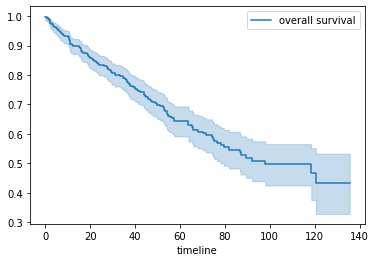

In [196]:
duration = interset_DF.loc[:,'OS/month']
observe = interset_DF.loc[:,'A2_Event']
kmf.fit(duration,observe,label='overall survival')

fig = plt.figure(figsize=(6,4))
ax = fig.gca();
kmf.plot(ax=ax);

partition

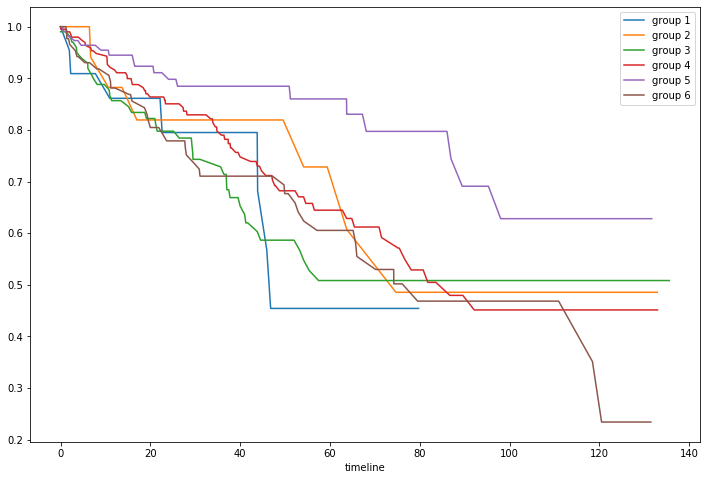

In [219]:
fig = plt.figure(figsize=(12,8))
ax = fig.gca();
for i in range(6):
    duration_i = interset_DF.loc[interset_DF.ac6 == i,'OS/month']
    observe_i = interset_DF.loc[interset_DF.ac6 == i,'A2_Event']
    kmf.fit(duration_i,observe_i,label='group {}'.format(i+1))
    kmf.survival_function_.plot(ax=ax)

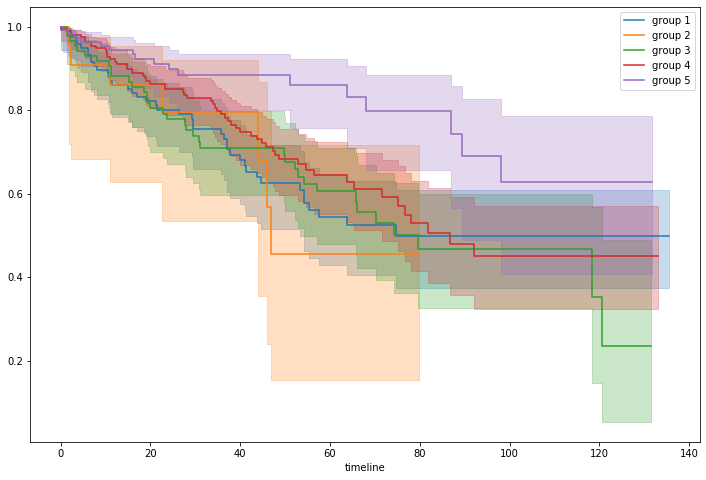

In [221]:
fig = plt.figure(figsize=(12,8))
ax = fig.gca();
for i in range(5):
    duration_i = interset_DF.loc[interset_DF.ac5 == i,'OS/month']
    observe_i = interset_DF.loc[interset_DF.ac5 == i,'A2_Event']
    kmf.fit(duration_i,observe_i,label='group {}'.format(i+1))
#     kmf.survival_function_.plot(ax=ax);
    kmf.plot(ax=ax);

### gmm


In [637]:
# save the current cluster result
method = 'km'
DF_3 = DF_filtered.copy()
for i,n_cluster in enumerate(range(4,9)):
    DF_3.loc[:,method+str(n_cluster)] = labels[method][i]

# DF_3.loc[:,['id','ac6','ac5']].to_csv(os.path.join(PATH.report_path,'cluster_label_v2.csv'),index=False)

In [530]:
np.sum(DF_3.gmm5 == 2)

2445

In [638]:
OS_EFS = pd.read_csv(os.path.join(PATH.data_path,'label','survival_time.csv')).drop(['Unnamed: 3'],axis=1)  # read csv data
OS_EFS.head(3)

,A0_Samples,OS/month,A2_Event,EFS/month,A8_New_Event
0,TCGA-KM-8477,51.766667,0.0,51.766667,0
1,TCGA-UW-A7GG,44.233333,0.0,44.233333,0
2,TCGA-KO-8410,104.533333,0.0,104.533333,0


In [639]:
# seems like the id of OS EFS csv is only the first 12 letters
DF_3.loc[:,'A0_Samples'] = DF_3.id.apply(lambda x: x[:12])
interset_DF=OS_EFS.merge(DF_3.iloc[:,21:],right_on=['A0_Samples'],left_on=['A0_Samples']) 
# merge the DF to have the intersect

interset_DF=interset_DF.dropna()
interset_DF.head(3)

,A0_Samples,OS/month,A2_Event,EFS/month,A8_New_Event,km4,km5,km6,km7,km8
0,TCGA-KO-8414,107.066667,0.0,107.066667,0,3,0,4,1,4
1,TCGA-KO-8404,10.833333,1.0,4.933333,1,2,3,2,2,6
2,TCGA-KO-8405,101.866667,0.0,101.866667,0,3,3,2,2,6


overall

partition

In [300]:
from scipy import stats

In [501]:
import math

In [376]:
np.ceil(kmf_dic[2].survival_function_.index.max() /14)

10.0

In [508]:
def generate_group_quantile(kmf_dic,n_interval=14):
    """
    for each group, generate survival frequancy of the fixed timestep
    ...kmf_dic : the dict type object, each element should be a kmf
    ...n_interval : the number of time windows
    """
    max_time = 0.0
    quantile = np.zeros((len(kmf_dic),n_interval),np.float64)  # the final array, raw : sample , columns : interval
    
    for i in kmf_dic.keys():
        max_time = max(max_time,kmf_dic[i].survival_function_.index.max())
    
    interval = np.ceil(max_time / n_interval)
    
    for i in kmf_dic.keys():
        DF = kmf_dic[i].survival_function_
        last_interval = int(DF.index.max() // interval) 
        # the maximum length of the certain df, after which will full of 0
        
        for itv in range(last_interval):
            count = np.mean(DF.loc[(DF.index > 10*itv)&(DF.index < 10*(itv+1))]) # take the mean value of those fall in these region
            
            # check nan
            if not math.isnan(count):
                quantile[i,itv] = count
            elif itv == 0:
                quantile[i,itv] = 1.0
            else:
                quantile[i,itv] = quantile[i,itv-1]
                
    return quantile

In [510]:
group_quantile = generate_group_quantile(kmf_dic)

In [517]:
distri = group_quantile[:,:-1] - group_quantile[:,1:]

In [518]:
np.sum(distri,axis=1)

array([0.99897119, 1.        , 0.94927029, 0.95329871, 0.97664892])

In [520]:
stats.chisquare(distri[0],distri[1])

Power_divergenceResult(statistic=nan, pvalue=nan)

In [524]:
np.sum(interset_DF[method+str(n_cluster)] == 0)

118

In [ ]:
def survival_curve(DF,method,n_clusters,duration_col='OS/month',observe_col='A2_Event',ax=None,plotting=True):
    """
    fit Kaplan-Meier model and plot the curve
    ...DF : the Data-frame containing both survival info (duration and observation) and 
    ...method : the cluster method : {'ac','km','gmm'}
    ...n_cluster : 
    """
    if ax is not None:
        fig = plt.figure(figsize=(12,8))
        ax = fig.gca();
    kmf_dic = {}
    for i in range(n_cluster):
        kmf_dic[i] = KaplanMeierFitter()
        duration_i = interset_DF.loc[interset_DF[method+str(n_cluster)] == i,'OS/month']
        observe_i = interset_DF.loc[interset_DF[method+str(n_cluster)] == i,'A2_Event']
        kmf_dic[i].fit(duration_i,observe_i,label='group {}'.format(i+1))
#         kmf.survival_function_.plot(ax=ax)
        if plotting:
            kmf_dic[i].plot(ax=ax)
    return kmf_dic

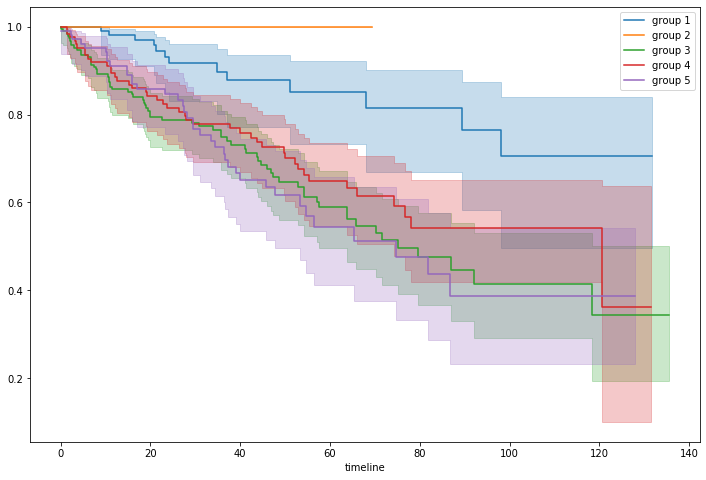

In [681]:
fig = plt.figure(figsize=(12,8))
ax = fig.gca();
kmf_dic = {}
method = 'gmm'
n_cluster = 5
for i in range(n_cluster):
    kmf_dic[i] = KaplanMeierFitter()
    duration_i = interset_DF.loc[interset_DF[method+str(n_cluster)] == i,'OS/month']
    observe_i = interset_DF.loc[interset_DF[method+str(n_cluster)] == i,'A2_Event']
    kmf_dic[i].fit(duration_i,observe_i,label='group {}'.format(i+1))
#     kmf.survival_function_.plot(ax=ax)
    kmf_dic[i].plot(ax=ax)
    
# duration = interset_DF.loc[:,'OS/month']
# observe = interset_DF.loc[:,'A2_Event']
# kmf.fit(duration,observe,label='overall survival')
# kmf.plot(ax=ax);

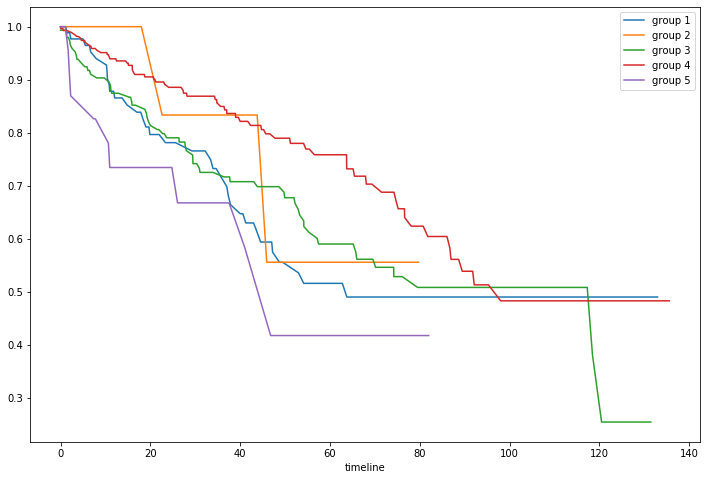

In [172]:
fig = plt.figure(figsize=(12,8))
ax = fig.gca();
for i in range(5):
    duration_i = interset_DF.loc[interset_DF.v2_c5 == i,'OS/month']
    observe_i = interset_DF.loc[interset_DF.v2_c5 == i,'A2_Event']
    kmf.fit(duration_i,observe_i,label='group {}'.format(i+1))
    kmf.survival_function_.plot(ax=ax);

In [663]:
from lifelines import CoxPHFitter

In [661]:
def CoxPH_test(DF=interset_DF,group_to_test=[0,4],n_cluster=5,method='gmm'):
    df_ls = []
    for i,group in enumerate(group_to_test):
        duration_i = interset_DF.loc[interset_DF[method+str(n_cluster)] == group,'OS/month']
        observe_i = interset_DF.loc[interset_DF[method+str(n_cluster)] == group,'A2_Event']
        df_ls.append(pd.DataFrame({'duration':duration_i,'observe':observe_i,'group':i}))

    cpf_df = pd.concat(df_ls,axis=0)
    cpf = CoxPHFitter()
    cpf.fit(df=cph_df,duration_col='duration',event_col='observe')
    return cpf

In [662]:
CoxPH_test(interset_DF,[2,0],n_cluster=6)

TypeError: super(type, obj): obj must be an instance or subtype of type

In [649]:
# result=CoxPH_test(interset_DF,[0,4]).print_summary()
for i in range(0,6):
    for j in range(i+1,6):
        cph=CoxPH_test(interset_DF,[i,j],n_cluster=6)
        print(cph.log_likelihood_ratio_test().p_value)

TypeError: super(type, obj): obj must be an instance or subtype of type

In [634]:
cph.log_likelihood_ratio_test().p_value

0.263046937560852

In [655]:
cph =CoxPH_test(interset_DF,[3,2])

cph.plot()

TypeError: super(type, obj): obj must be an instance or subtype of type

# after 2021 March 8

## inspect the distribution of each feature

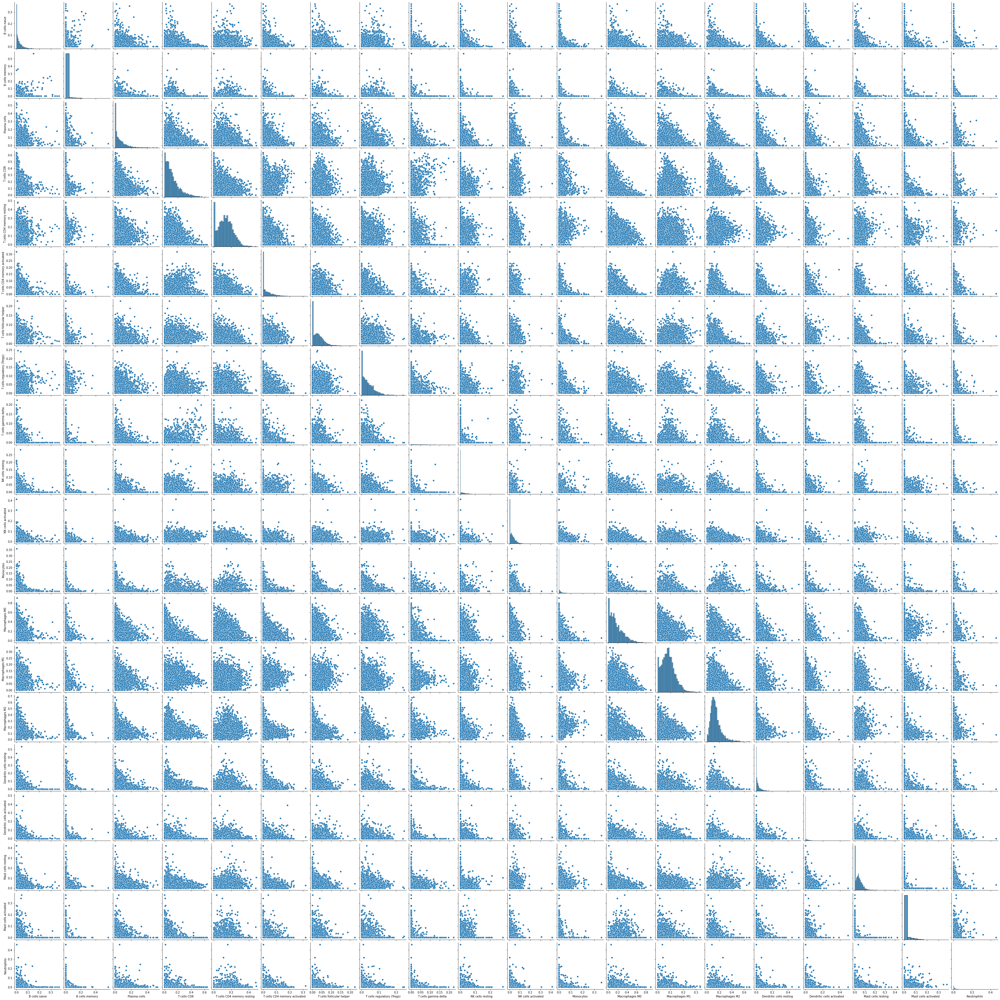

In [318]:
pp.fig

## test different T-SNE distance metrics

In [177]:
from sklearn.manifold import TSNE

In [ ]:
metrics.pairwise_distances()

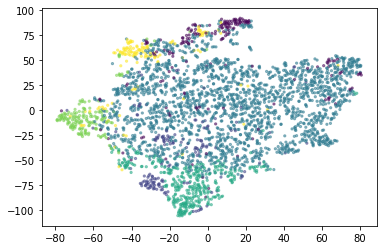

In [175]:
plt.scatter(tsne_1.axis0.values,tsne_1.axis1.values,s=5,alpha=0.5,c=n_labels['gmm'][2]);

In [ ]:
tsne=TSNE(n_components=2,perplexity=50,metric='manhattan').fit(pca_data)

manh_embedding = tsne.embedding_

In [600]:
tsne_eucli=TSNE(n_components=2,perplexity=20,metric='euclidean').fit(pca_data)

eucli_embedding = tsne_eucli.embedding_

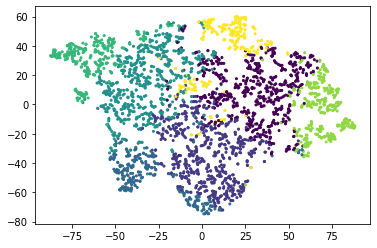

In [601]:
plt.scatter(eucli_embedding[:,0],eucli_embedding[:,1],s=4,c=r_labels['km'][4])

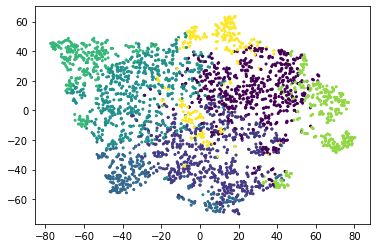

In [565]:
plt.scatter(eucli_embedding[:,0],eucli_embedding[:,1],s=4,c=r_labels['km'][4])

In [566]:
import umap

In [699]:
ummap = umap.UMAP(n_neighbors=500,
    metric='euclidean',
    metric_kwds=None,
    output_metric='euclidean',
    output_metric_kwds=None,
    n_epochs=None,
    learning_rate=1.0,
    init='spectral',
    min_dist=0.46,
    spread=1.0,
    low_memory=True,
    n_jobs=8,
    set_op_mix_ratio=1.0,
    local_connectivity=1.0,
    repulsion_strength=1,
    negative_sample_rate=5,
    transform_queue_size=4.0,
    a=None,
    b=None,
    random_state=None,
    angular_rp_forest=False,
    target_n_neighbors=-1,
    target_metric='categorical',
    target_metric_kwds=None,
    target_weight=0.5,
    transform_seed=42,
    transform_mode='embedding',
    force_approximation_algorithm=True
)
%time ummap.fit(data)

CPU times: user 2min 19s, sys: 2.54 s, total: 2min 21s
Wall time: 25.6 s


UMAP(dens_frac=0.0, dens_lambda=0.0, force_approximation_algorithm=True,
     min_dist=0.46, n_jobs=8, n_neighbors=500, repulsion_strength=1)

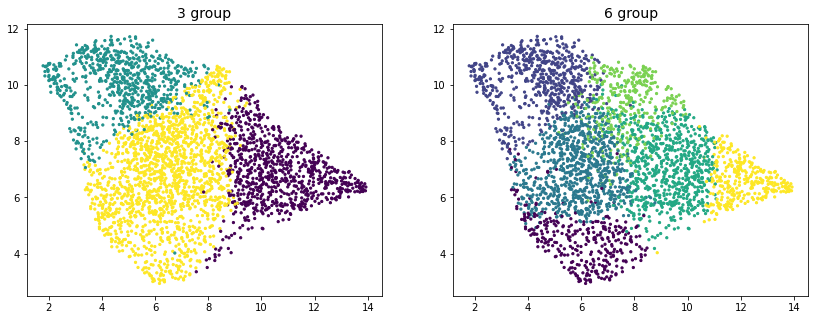

In [700]:
# local_connectivity=5.0
n500_md036=ummap.embedding_
# ploting
plot_3and6_group(n500_md036)

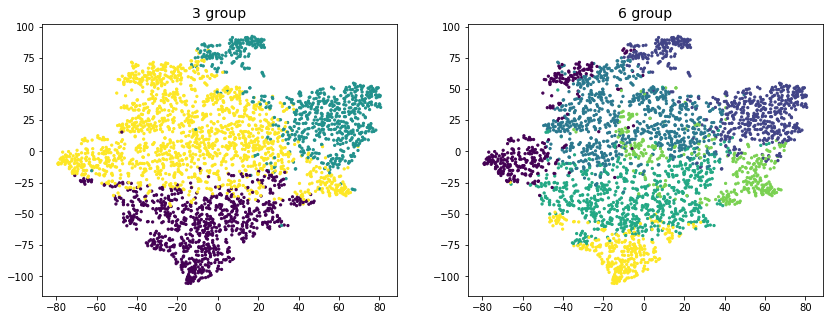

In [696]:
tsne = tsne_1[['axis0',"axis1"]].values
plot_3and6_group(tsne)

def plot_3and6_group(um_embedding):
    fig,axs = plt.subplots(1,2,figsize=(14,5))

    axs[0].scatter(um_embedding[:,0],um_embedding[:,1],s=5,c=r_labels['km'][0]);
    axs[0].set_title("%d group"%len(np.unique(r_labels['km'][0])),fontsize=14)
    axs[1].scatter(um_embedding[:,0],um_embedding[:,1],s=5,c=r_labels['km'][3]);
    axs[1].set_title("%d group"%len(np.unique(r_labels['km'][3])),fontsize=14)

## n_neighbors

n_neighbors=500  
min_dist=0.36

(3136, 2)


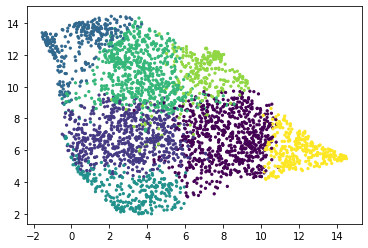

In [672]:
print(ummap.embedding_.shape)

plt.scatter(ummap.embedding_[:,0],ummap.embedding_[:,1],s=5,c=r_labels['km'][4]);

(3136, 2)


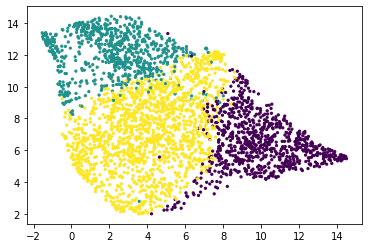

In [674]:
print(ummap.embedding_.shape)

plt.scatter(ummap.embedding_[:,0],ummap.embedding_[:,1],s=5,c=r_labels['km'][0]);

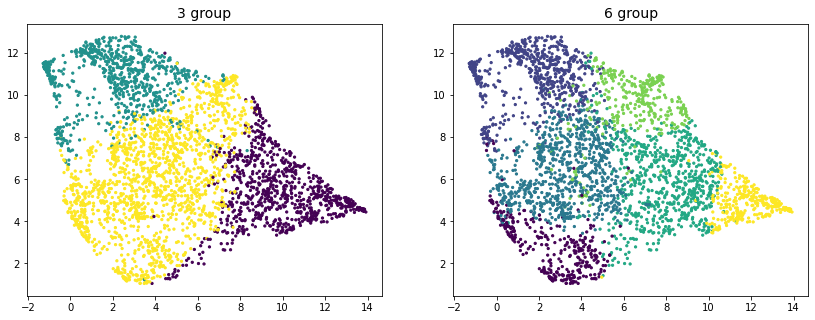

In [685]:
# n200_md016=ummap.embedding_
# ploting
plot_3and6_group(n200_md016)

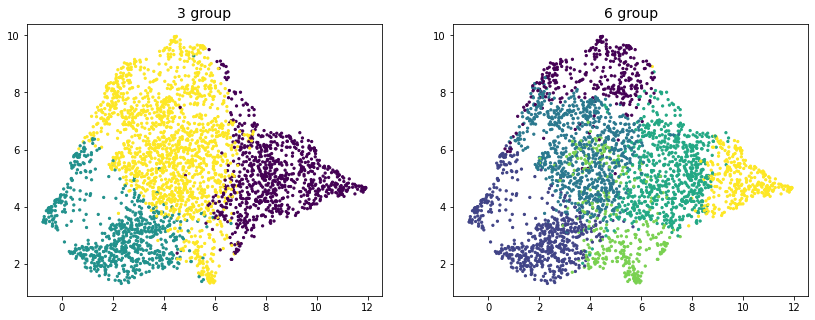

In [690]:
# repulsion_strength=30,
n200_md022_p30=ummap.embedding_
# ploting
plot_3and6_group(n200_md022_p30)

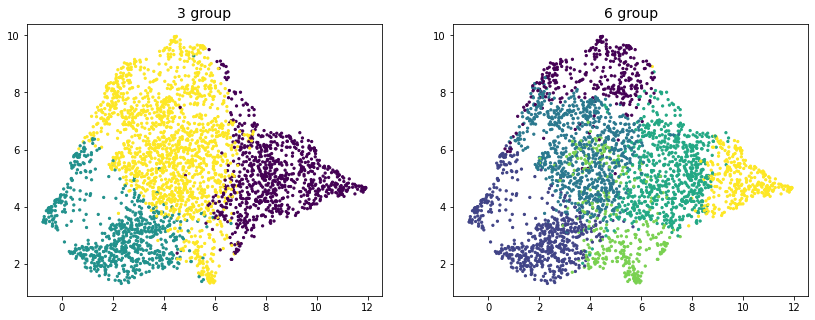

In [691]:
# repulsion_strength=30,
n200_md022_p30=ummap.embedding_
# ploting
plot_3and6_group(n200_md022_p30)

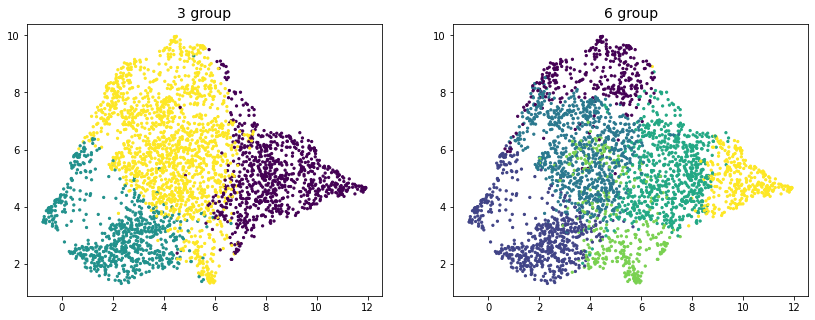

In [692]:
# local_connectivity=5.0
n200_md022_lc5=ummap.embedding_
# ploting
plot_3and6_group(n200_md022_lc5)

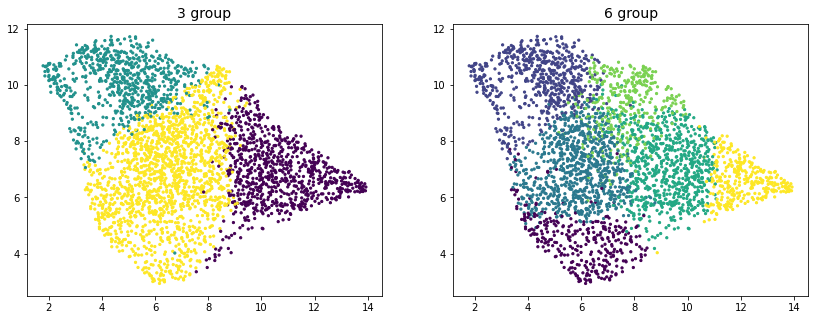

In [700]:
# local_connectivity=5.0
n500_md046=ummap.embedding_
# ploting
plot_3and6_group(n500_md046)

In [702]:
umap_df = tsne_1.loc[:,["id","axis0","axis1"]]
umap_df.loc[:,'axis0'] = n500_md036[:,0]
umap_df.loc[:,'axis1'] = n500_md036[:,1]
umap_df.to_csv("t_sne/Umap_project_n500_md_046.csv",index=False)